In [1]:
#Upload the required dataset
from google.colab import files
files.upload()

Saving employee_data.csv to employee_data.csv


{'employee_data.csv': b'Employee_ID,Department,Gender,Age,Job_Title,Hire_Date,Years_At_Company,Education_Level,Performance_Score,Monthly_Salary,Work_Hours_Per_Week,Projects_Handled,Overtime_Hours,Sick_Days,Remote_Work_Frequency,Team_Size,Training_Hours,Promotions,Employee_Satisfaction_Score,Resigned\n1,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63,False\n2,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72,False\n3,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17,False\n4,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86,False\n5,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25,False\n6,IT,Male,43,Manager,2016-08-14 08:03:05.556036,8,High School,3,7800.0,46,31,8,0,100,15,95,0,2.77,False\n7,IT,Male,37,Technician,2023

In [2]:
#Import the required libraries
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
import warnings
warnings.filterwarnings('ignore')


In [3]:
employee_data=pd.read_csv('employee_data.csv')
employee_data.head()
employee_data.describe()
employee_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 20 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Employee_ID                  100000 non-null  int64  
 1   Department                   100000 non-null  object 
 2   Gender                       100000 non-null  object 
 3   Age                          100000 non-null  int64  
 4   Job_Title                    100000 non-null  object 
 5   Hire_Date                    100000 non-null  object 
 6   Years_At_Company             100000 non-null  int64  
 7   Education_Level              100000 non-null  object 
 8   Performance_Score            100000 non-null  int64  
 9   Monthly_Salary               100000 non-null  float64
 10  Work_Hours_Per_Week          100000 non-null  int64  
 11  Projects_Handled             100000 non-null  int64  
 12  Overtime_Hours               100000 non-null  int64  
 13  

In [4]:
#Change the headings of the columns into a reliable format
employee_data.columns=(employee_data.columns
                       .str.strip()
                       .str.lower()
                       .str.replace(r'[\s\-]+', '_', regex=True)
)
employee_data.head()



,employee_id,department,gender,age,job_title,hire_date,years_at_company,education_level,performance_score,monthly_salary,work_hours_per_week,projects_handled,overtime_hours,sick_days,remote_work_frequency,team_size,training_hours,promotions,employee_satisfaction_score,resigned
0,1,IT,Male,55,Specialist,2022-01-19 08:03:05.556036,2,High School,5,6750.0,33,32,22,2,0,14,66,0,2.63,False
1,2,Finance,Male,29,Developer,2024-04-18 08:03:05.556036,0,High School,5,7500.0,34,34,13,14,100,12,61,2,1.72,False
2,3,Finance,Male,55,Specialist,2015-10-26 08:03:05.556036,8,High School,3,5850.0,37,27,6,3,50,10,1,0,3.17,False
3,4,Customer Support,Female,48,Analyst,2016-10-22 08:03:05.556036,7,Bachelor,2,4800.0,52,10,28,12,100,10,0,1,1.86,False
4,5,Engineering,Female,36,Analyst,2021-07-23 08:03:05.556036,3,Bachelor,2,4800.0,38,11,29,13,100,15,9,1,1.25,False


In [5]:
#Convert the datatypes for the below columns
employee_data['hire_date']=pd.to_datetime(employee_data['hire_date'])
employee_data['gender'] = employee_data['gender'].astype('category')
employee_data['job_title'] = employee_data['job_title'].astype('category')
employee_data['department'] = employee_data['department'].astype('category')
employee_data['education_level'] = employee_data['education_level'].astype('category')


In [6]:
#Check whether null values are present in the dataset
employee_data.isnull().sum()

,0
employee_id,0
department,0
gender,0
age,0
job_title,0
hire_date,0
years_at_company,0
education_level,0
performance_score,0
monthly_salary,0


In [7]:
#Split the employee groups into low training and high training groups
median_training= employee_data['training_hours'].median()
employee_data['training_group']=np.where(employee_data['training_hours']<=median_training,'Low Training','High Training')
employee_data['training_group'].value_counts()

,count
training_group,
Low Training,50139
High Training,49861


In [8]:
#Descriptive statistics
descriptive_statistics=employee_data.groupby('training_group')['performance_score'].describe()
descriptive_statistics

,count,mean,std,min,25%,50%,75%,max
training_group,,,,,,,,
High Training,49861.0,3.000060,1.413440,1.0,2.0,3.0,4.0,5.0
Low Training,50139.0,2.990826,1.416002,1.0,2.0,3.0,4.0,5.0


In [9]:
mean_performance = employee_data.groupby('training_group')['performance_score'].mean()
mean_performance

,performance_score
training_group,
High Training,3.000060
Low Training,2.990826


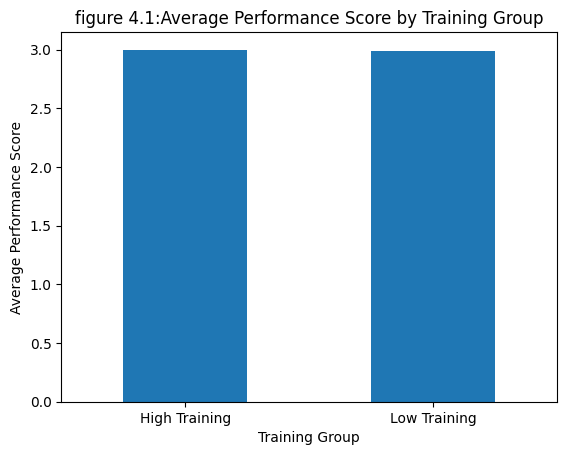

In [10]:
mean_performance.plot(kind='bar')
plt.title('figure 4.1:Average Performance Score by Training Group')
plt.xlabel('Training Group')
plt.ylabel('Average Performance Score')
plt.xticks(rotation=0)
plt.show()


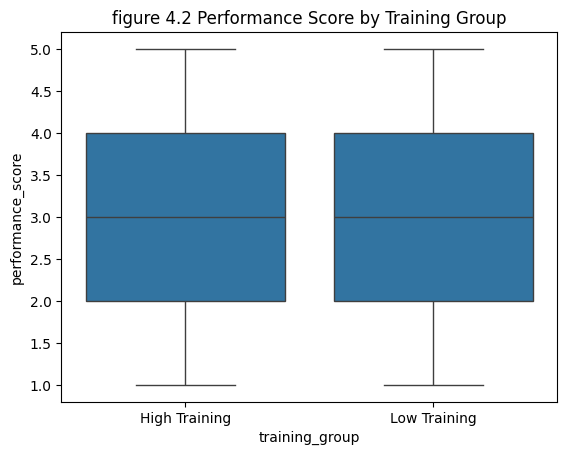

In [11]:
sns.boxplot(x='training_group', y='performance_score', data=employee_data)
plt.title('figure 4.2 Performance Score by Training Group')
plt.show()

Hypothesis Formulation
**Null Hypothesis:** The Employee training hours do not have a statistically significant impact on the employee productivity as measured by the performance scores.
**Alternate Hypothesis:** The Employee training hours have a statistically significant impact on the employee productivity as measured by the performance scores.

In [12]:
low = employee_data[employee_data['training_group'] == 'Low Training']['performance_score']
high = employee_data[employee_data['training_group'] == 'High Training']['performance_score']

t_stat, p_value = ttest_ind(high, low, equal_var=False)
t_stat, p_value

(np.float64(1.0320943200743926), np.float64(0.30203043056358464))

**Hypothesis testing conclusion**

Independent Samples t-test result
t-statistic=1.03
p-value=0.3
Since the p-value is greater than 0.05, we cannot reject the null hypothesis. This indicates that there is no statistically significant difference in performance scores between employees with high training hours and low training hours


**Business Interpretation**

The employees with higher training hours showed a slightly higher average performance than employees with lower training hours.But the difference shown is not statistically significant.From this, it can be interpreted that the training hours alone do not help in improving employee productivity. Along with training given,there may be other factors influencing productivity such as environment,work-life balance,motivation,job satisfaction and other psychological factors of an employee.

**Summary**

This notebook analyzed the impact of employee training hours on productivity using hypothesis testing.Based on the independent samples t-test results, training hours were found to have no statistically significant impact on employee performance scores in the given dataset.
